# Sentiment Analysis of Text Reviews

This project focuses on analyzing the sentiment of given text reviews. The objective is to classify each text as **positive**, **negative**, or **neutral** using various Natural Language Processing (NLP) techniques and machine learning models.


### Importing necessary libraries.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install nlp_utils


In [ ]:
!pip install contractions


In [ ]:
import re
import nltk
import string
import nlp_utils
import collections
import contractions
import nlp_utils as nu
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS
from nltk.tokenize import word_tokenize,sent_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import PorterStemmer, LancasterStemmer, SnowballStemmer

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [ ]:
# Loading data.
with open('TextAnalytics.txt','r') as f:
    text = f.read()

In [ ]:
text
### The data is in the form of a text.

'0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you\'ll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the main appeal of the show is due to th

# Text Normalization

### Text normalization is the process of transforming a text into a canonical (standard) form. For example, the word “gooood” and “gud” can be transformed to “good”, its canonical form. Another example is mapping of near identical words such as “stopwords”, “stop-words” and “stop words” to just “stopwords”

In [ ]:
# splitting at ( \n ).
text=text.split('\n')
# Separating at new line using '\n'

In [ ]:
# splitting at ( \t ).
corpus = [text]
for sent in text:
    corpus.append(sent.split('\t'))
# Splitting String by tab(\t)

In [ ]:
letters_only = re.sub(r'[^a-zA-Z]',
                          " ",
                          str(corpus))
# Taking only letters

### Tokenization
What is Tokenization?
Tokenization is the process by which big quantity of text is divided into smaller parts called tokens.

Natural language processing is used for building applications such as Text classification, intelligent chatbot, sentimental analysis, language translation, etc. It becomes vital to understand the pattern in the text to achieve the above-stated purpose. These tokens are very useful for finding such patterns as well as is considered as a base step for stemming and lemmatization.

Sentence tokenization is the process of splitting text into individual sentences. ... It does this by looking for the types of textual constructs that confuse the tokenizer and replacing them with single words.

In [ ]:
import nltk
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# converting to lowercase.
letters_only=letters_only.lower()

import nltk
# Download 'punkt_tab' resource
nltk.download('punkt_tab')

token=nltk.sent_tokenize(letters_only)
token

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


['      one of the other reviewers has mentioned that after watching just   oz episode you  ll be hooked  they are right  as this is exactly what happened with me  br    br   the first thing that struck me about oz was its brutality and unflinching scenes of violence  which set in right from the word go  trust me  this is not a show for the faint hearted or timid  this show pulls no punches with regards to drugs  sex or violence  its is hardcore  in the classic use of the word  br    br   it is called oz as that is the nickname given to the oswald maximum security state penitentary  it focuses mainly on emerald city  an experimental section of the prison where all the cells have glass fronts and face inwards  so privacy is not high on the agenda  em city is home to many  aryans  muslims  gangstas  latinos  christians  italians  irish and more    so scuffles  death stares  dodgy dealings and shady agreements are never far away  br    br   i would say the main appeal of the show is due t

In [ ]:
letters_only = letters_only.lower()

token = nltk.sent_tokenize(letters_only)
print(token)


['      one of the other reviewers has mentioned that after watching just   oz episode you  ll be hooked  they are right  as this is exactly what happened with me  br    br   the first thing that struck me about oz was its brutality and unflinching scenes of violence  which set in right from the word go  trust me  this is not a show for the faint hearted or timid  this show pulls no punches with regards to drugs  sex or violence  its is hardcore  in the classic use of the word  br    br   it is called oz as that is the nickname given to the oswald maximum security state penitentary  it focuses mainly on emerald city  an experimental section of the prison where all the cells have glass fronts and face inwards  so privacy is not high on the agenda  em city is home to many  aryans  muslims  gangstas  latinos  christians  italians  irish and more    so scuffles  death stares  dodgy dealings and shady agreements are never far away  br    br   i would say the main appeal of the show is due t

### Alphanumeric characters

In [ ]:
import nltk
nltk.download('punkt', quiet=True)
from nltk.tokenize import word_tokenize

def num_dec_al(word):
    if word.isnumeric():
        return 'xxxxxx'
    elif word.isdecimal():
        return 'xxx...'
    elif word.isalpha():
        return word
    else:
        return 'xxxaaa'

def clean_nda(token):
    tokens = word_tokenize(token)
    map_list = list(map(num_dec_al, tokens))
    return " ".join(map_list)

corpus_nda = list(map(clean_nda, token))
print(corpus_nda)


['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t d

### Removing Contractions.
It is a process where words like isn't, didn't are expanded to is not did not.
isn't --> is not,
I'm --> I am,
they're --> they are,
shouldn't --> should not,
can't --> can not

In [ ]:
import contractions
import nltk
import re
import string

def contraction_remove(corpus_nda):
    corpus_nda = contractions.fix(corpus_nda)
    return corpus_nda

special = string.punctuation
def w_tokenization(corpus_nda):
    # convert into lower case
    corpus_nda = corpus_nda.lower()
    # contraction
    corpus_nda = contraction_remove(corpus_nda)
    #
    tokens = nltk.word_tokenize(corpus_nda) # word tokens
    ## contractions have been expanded and the letters have been converted to lowercase.
    return tokens


In [ ]:
corpus_nda
## corpus_nda with expanded contractions and converted to lowercase.

['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t d

In [ ]:
data = [corpus_nda]
for sent in text:
    data.append(sent.split('\t'))
# Separating at tab

In [ ]:
data.append(sent.split('\n'))
# Separating at newline

In [ ]:
data
# Cleaned text

[['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t 

In [ ]:
df = pd.DataFrame(data)
## Saving the data into a dataframe.

In [ ]:
df

,0,1,2,3,4,5,6
0,one of the other reviewers has mentioned that ...,None,None,None,None,None,None
1,"0,""One of the other reviewers has mentioned th...",None,None,None,None,None,None
2,"1,""A wonderful little production. <br /><br />...",None,None,None,None,None,None
3,"2,""I thought this was a wonderful way to spend...",None,None,None,None,None,None
4,"3,""Basically there's a family where a little b...",None,None,None,None,None,None
...,...,...,...,...,...,...,...
997,"996,""I hated it. I hate self-aware pretentious...",None,None,None,None,None,None
998,"997,""I usually try to be professional and cons...",None,None,None,None,None,None
999,"998,""If you like me is going to see this in a ...",None,None,None,None,None,None
1000,"999,""This is like a zoology textbook, given th...",None,None,None,None,None,None


In [ ]:
df.drop([1,2,3,4,5,6],axis=1,inplace=True)
# dropping unnecessary columns.

In [ ]:
df
# Resulting dataframe.

,0
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


In [ ]:
df= df.rename(columns={0: 'Text'})
# Renaming the column 0 as 'Text'

#### Final Dataset.

In [ ]:
df

,Text
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


### Rows 0,1 and 1000 and 1001 have repeated hence needs to be cleaned.

In [ ]:
df.drop(df.index[:1], inplace=True)
# row 1 has repeated so it is dropped.

In [ ]:
df.drop(df.index[1000:], inplace=True)
# row 1000 has repeated aswell, so it is dropped.

In [ ]:
df

,Text
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
5,"4,""Petter Mattei's """"Love in the Time of Money..."
...,...
996,"995,""Nothing is sacred. Just ask Ernie Fosseli..."
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."


### Removing additional characters present in the dataframe.

In [ ]:
## We can further see that there are still some special characters in the dataframe which have to be treated.
df.replace('\d+', '', regex=True, inplace=True)
df.replace(',', '', regex=True, inplace=True)
df.replace('br', '', regex=True, inplace=True)
df.replace('"', '', regex=True, inplace=True)
df.replace("'", '', regex=True, inplace=True)
df.replace('?', '', inplace=True)
df.replace("-", '', regex=True, inplace=True)
df.replace("*", '', inplace=True)
df.replace("***", '', inplace=True)
df.replace("< />", '', regex=True, inplace=True)

In [ ]:
df['Text'] = df['Text'].str.strip('[')
df['Text'] = df['Text'].str.strip(']')
df['Text'] = df['Text'].str.strip(')')
df['Text'] = df['Text'].str.strip('(')
## Using the strip function in order to delete the special characters.

In [ ]:
df

,Text
1,One of the other reviewers has mentioned that ...
2,A wonderful little production. The filming tec...
3,I thought this was a wonderful way to spend ti...
4,Basically theres a family where a little boy (...
5,Petter Matteis Love in the Time of Money is a ...
...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...
997,I hated it. I hate selfaware pretentious inani...
998,I usually try to be professional and construct...
999,If you like me is going to see this in a film ...


## Lemmatization of the text column

In [ ]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

Lemmatization usually refers to doing things properly with the use of a vocabulary and morphological analysis of words, normally aiming to remove inflectional endings only and to return the base or dictionary form of a word, which is known as the lemma.
Lemmatization will generate the root form of the inflected words

In [ ]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

lemmatizer = WordNetLemmatizer()

def lemmatization_sentence(text):
    tokens = word_tokenize(text)
    lemmatized = [lemmatizer.lemmatize(token) for token in tokens]
    return " ".join(lemmatized)

df['Text'] = df['Text'].apply(lemmatization_sentence)


In [ ]:
Text=df['Text']

In [ ]:
token = df['Text'].tolist()  # Convert column to list of strings
token = [sentence for text in token for sentence in nltk.sent_tokenize(text)]  # Sentence tokenize each text and flatten
data = np.array(token)  # Convert list of sentences to numpy array


In [ ]:
token=nltk.sent_tokenize(str(token))
## Sentence tokenization

In [ ]:
data = np.array(token)
## Saving token in form of array

In [ ]:
import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
stop = stopwords.words('english')
## Saving stopwords in stop

### Removing stopwords from the dataframe

In [ ]:
text = data
text_tokens = word_tokenize(str(text))

tokens_without_sw = [word for word in text_tokens if not word in stop]

print(tokens_without_sw)
## Removing stopwords from the text and printing the words without stopwords

['[', '``', '[', "'One", 'reviewer', 'ha', 'mentioned', 'watching', 'Oz', 'episode', 'youll', 'hooked', '.', "''", '``', "'", ',', "'They", 'right', 'exactly', 'happened', 'me.The', 'first', 'thing', 'struck', 'Oz', 'wa', 'utality', 'unflinching', 'scene', 'violence', 'set', 'right', 'word', 'GO', '.', "''", '``', "'", ',', "'Trust", 'show', 'faint', 'hearted', 'timid', '.', "''", '...', '``', "'", ',', "'Any", 'time', 'youre', 'hunted', 'giant', 'creature', 'great', 'time', 'hit', 'girl', 'half', 'age', '.', "''", '``', "'", ',', "'Animal", 'noise', 'appropriate', 'masking', 'noise', 'swearing', 'volume', '.', "''", '``', "'", ',', "'Old", 'Israeli', 'Russian', 'plane', 'regularly', 'used', 'US', 'Military', '.', "'", ']', "''", ']']


# Visualization

In [ ]:
stopwords = set(stopwords.words("english"))
## Removing stopwords for wordcloud visualization

In [ ]:
wordcloud = WordCloud(stopwords=stop, background_color="white", max_words=1000).generate(str(tokens_without_sw))
## WordCloud is a technique to show which words are the most frequent among the given text

### Visualizing the highest repeating words in the dataframe using  the wordcloud.

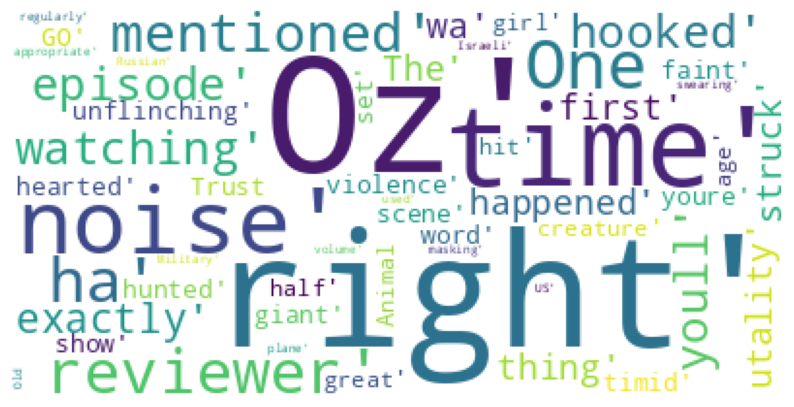

In [ ]:
rcParams['figure.figsize'] = 10, 20
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

### Counting the number of times a word has repeated through out the data.

In [ ]:
tokens_without_sw=(str(tokens_without_sw))

In [ ]:
filtered_words = [word for word in tokens_without_sw.split() if word not in stopwords]
counted_words = collections.Counter(filtered_words)

words = []
counts = []
for letter, count in counted_words.most_common(10):
    words.append(letter)
    counts.append(count)
# Removing stopwords as creating two lists to display the words and their counts

In [ ]:
counted_words.most_common(100) # the word 'movie' has repeated for 2081 times.

[("'``',", 6),
 ("'.',", 6),
 ('"\'\'",', 6),
 ('"\'",', 6),
 ("',',", 5),
 ("'Oz',", 2),
 ("'right',", 2),
 ("'time',", 2),
 ("'noise',", 2),
 ("['[',", 1),
 ("'[',", 1),
 ('"\'One",', 1),
 ("'reviewer',", 1),
 ("'ha',", 1),
 ("'mentioned',", 1),
 ("'watching',", 1),
 ("'episode',", 1),
 ("'youll',", 1),
 ("'hooked',", 1),
 ('"\'They",', 1),
 ("'exactly',", 1),
 ("'happened',", 1),
 ("'me.The',", 1),
 ("'first',", 1),
 ("'thing',", 1),
 ("'struck',", 1),
 ("'wa',", 1),
 ("'utality',", 1),
 ("'unflinching',", 1),
 ("'scene',", 1),
 ("'violence',", 1),
 ("'set',", 1),
 ("'word',", 1),
 ("'GO',", 1),
 ('"\'Trust",', 1),
 ("'show',", 1),
 ("'faint',", 1),
 ("'hearted',", 1),
 ("'timid',", 1),
 ("'...',", 1),
 ('"\'Any",', 1),
 ("'youre',", 1),
 ("'hunted',", 1),
 ("'giant',", 1),
 ("'creature',", 1),
 ("'great',", 1),
 ("'hit',", 1),
 ("'girl',", 1),
 ("'half',", 1),
 ("'age',", 1),
 ('"\'Animal",', 1),
 ("'appropriate',", 1),
 ("'masking',", 1),
 ("'swearing',", 1),
 ("'volume',", 1),
 (

# Visualizing top 10 repeated/common words using bar graph.

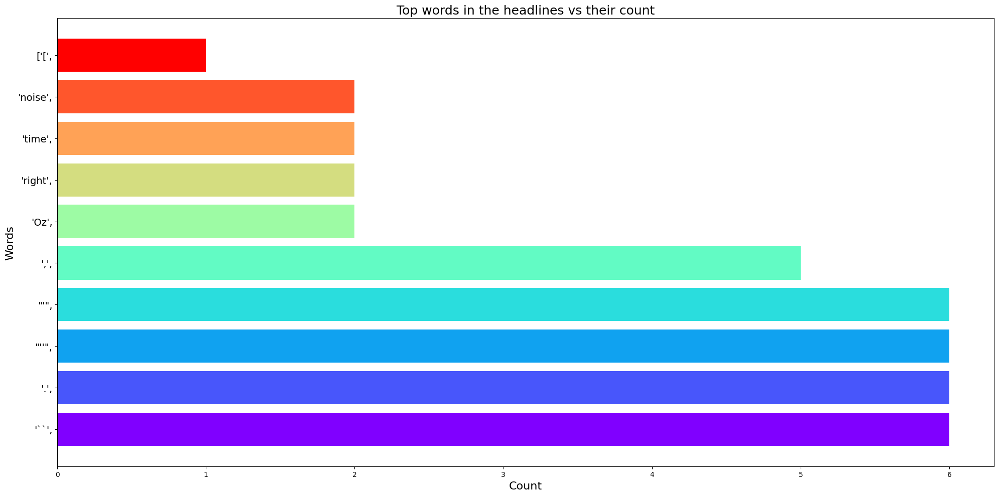

In [ ]:
colors = cm.rainbow(np.linspace(0, 1, len(words)))
rcParams['figure.figsize'] = (20, 10)

plt.title('Top words in the headlines vs their count', fontsize=18)
plt.xlabel('Count', fontsize=16)
plt.ylabel('Words', fontsize=16)
plt.barh(words, counts, color=colors)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()


# Sentiment Analysis.

### Vader sentiment analysis is done in order to find if a given (Word) is positive, negative or  neutral in nature.
VADER belongs to a type of sentiment analysis that is based on lexicons of sentiment-related words. In this approach, each of the words in the lexicon is rated as to whether it is positive or negative, and in many cases, how positive or negative. Below you can see an excerpt from VADER’s lexicon, where more positive words have higher positive ratings and more negative words have lower negative ratings.
Vader sentiment analysis for a given (word) if positive, negative or  neutral in nature.

In [ ]:
import nltk
nltk.download('vader_lexicon')


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sentence = tokens_without_sw
tokenized_sentence = nltk.word_tokenize(sentence)

sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

for word in tokenized_sentence:
    if (sid.polarity_scores(word)['compound']) >= 0.1:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.1:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

print('Positive:',pos_word_list)
print('Neutral:',neu_word_list)
print('Negative:',neg_word_list)
score = sid.polarity_scores(sentence)
print('\nScores:', score)

Positive: ["'ha", "'Trust", "'great"]
Neutral: ['[', "'", '[', "'", ',', "'", '``', "'", ',', "'", '[', "'", ',', '``', "'One", "''", ',', "'reviewer", "'", ',', "'", ',', "'mentioned", "'", ',', "'watching", "'", ',', "'Oz", "'", ',', "'episode", "'", ',', "'youll", "'", ',', "'hooked", "'", ',', "'", '.', "'", ',', '``', "''", "''", ',', "'", '``', "'", ',', '``', "'", "''", ',', "'", ',', "'", ',', '``', "'They", "''", ',', "'right", "'", ',', "'exactly", "'", ',', "'happened", "'", ',', "'me.The", "'", ',', "'first", "'", ',', "'thing", "'", ',', "'", ',', "'Oz", "'", ',', "'wa", "'", ',', "'utality", "'", ',', "'unflinching", "'", ',', "'scene", "'", ',', "'", ',', "'set", "'", ',', "'right", "'", ',', "'word", "'", ',', "'GO", "'", ',', "'", '.', "'", ',', '``', "''", "''", ',', "'", '``', "'", ',', '``', "'", "''", ',', "'", ',', "'", ',', '``', "''", ',', "'show", "'", ',', "'faint", "'", ',', "'hearted", "'", ',', "'", ',', "'", '.', "'", ',', '``', "''", "''", ',', "'", '...'

In [ ]:
#pos_word_list[:100]
#neg_word_list[:100]

### Top 100 Positive words.

In [ ]:
print(list(iter(pos_word_list[:100]))) # These are the top 100 positive words found in the dataset.

["'ha", "'Trust", "'great"]


### Top 100 Negative words.

In [ ]:
print(list(iter(neg_word_list[:100]))) # These are the top 100 negative words found in the dataset.

["'struck", "'violence", "'timid", "'swearing"]


## Vader sentiment analysis for a given (Sentence) if positive, negative or  neutral in nature.

In [ ]:
sid = SentimentIntensityAnalyzer()
for sentence in Text:
     print(sentence)

     ss = sid.polarity_scores(sentence)
     for k in ss:
         print('{0}: {1}, ' .format(k, ss[k]), end='')
     print()

One of the other reviewer ha mentioned that after watching just Oz episode youll be hooked . They are right a this is exactly what happened with me.The first thing that struck me about Oz wa it utality and unflinching scene of violence which set in right from the word GO . Trust me this is not a show for the faint hearted or timid . This show pull no punch with regard to drug sex or violence . Its is hardcore in the classic use of the word.It is called OZ a that is the nickname given to the Oswald Maximum Security State Penitentary . It focus mainly on Emerald City an experimental section of the prison where all the cell have glass front and face inwards so privacy is not high on the agenda . Em City is home to many .. Aryans Muslims gangsta Latinos Christians Italians Irish and more .... so scuffle death stare dodgy dealing and shady agreement are never far away.I would say the main appeal of the show is due to the fact that it go where other show wouldnt dare . Forget pretty picture 

### Converting all Polarity scores and sentences into a dataframe.

In [ ]:
analyzer = SentimentIntensityAnalyzer()
df['rating'] = Text.apply(analyzer.polarity_scores)
df=pd.concat([df.drop(['rating'], axis=1), df['rating'].apply(pd.Series)], axis=1)
### Creating a dataframe.

In [ ]:
df.head()

,Text,neg,neu,pos,compound
1,One of the other reviewer ha mentioned that af...,0.196,0.742,0.062,-0.9938
2,A wonderful little production . The filming te...,0.075,0.734,0.190,0.9643
3,I thought this wa a wonderful way to spend tim...,0.109,0.659,0.232,0.9707
4,Basically there a family where a little boy ( ...,0.150,0.782,0.068,-0.9334
5,Petter Matteis Love in the Time of Money is a ...,0.053,0.782,0.165,0.9796


## Arranging the dataset in descending order based on (Compound score) to find the most important sentence from the given data.

In [ ]:
imp_sent=df.sort_values(by='compound', ascending=False)
## arranging the compound column in descending order to find the best sentence.

In [ ]:
imp_sent

,Text,neg,neu,pos,compound
567,Few would argue that master animation director...,0.037,0.709,0.254,0.9997
411,I firmly believe that the best Oscar ceremony ...,0.078,0.593,0.329,0.9997
211,I have just given a for Thieves Highway I ment...,0.096,0.593,0.311,0.9995
364,The plot : Michael Linnett Connors ha done eve...,0.019,0.805,0.176,0.9993
944,A film for mature educated audience ... I saw ...,0.076,0.658,0.266,0.9991
...,...,...,...,...,...
323,If only I had read the review by Alex Sander (...,0.199,0.698,0.103,-0.9978
825,Mexican Werewolf in Texas is set in the small ...,0.224,0.677,0.100,-0.9980
247,This show make absolutely no sense . Every wee...,0.353,0.586,0.061,-0.9984
766,This film cant make up it mind whether it mess...,0.264,0.624,0.113,-0.9987


In [ ]:
print(df['Text'].iloc[410] ) # sentence with index 410 has the highest compound score
                             # and hence it is the most important sentence among all the sentences.

I firmly believe that the best Oscar ceremony in recent year wa in for two reason : ) Host Steve Martin wa at his most wittiest : I saw the teamster help Michael Moore into the trunk of his limo and Ill better not mention the gay mafia in case I wake up with a poodle head in my bed ) Surprise winner : No one had Adrien Brody down for best actor ( Genuine applause ) or Roman Polanski for best director ( Genuine jeer and boo ) but they won Last year award ceremony wasnt too bad but there wa little in the way of surprise and I wa happy to see RETURN OF THE KING sweep the award even if it wasnt the best in the trilogy ( FELLOWSHIP wa much better ) but what let the BBC coverage down wa Jonathan Ross getting a few of his sycophantic mate round and pretending they were hilarious when they were anything but . So when I heard Sky were doing the coverage for British TV I wa expecting Barry Norman and Mark Kermode to be doing the link but instead we ended up with Jamie Theakston and Sharon Osbour

## Finding top positive sentence in the data.

In [ ]:
pos_sent=df.sort_values(by='pos', ascending=False)
## Arranging the dataframe by positive column in descending order to find the best postive sentence.

In [ ]:
pos_sent

,Text,neg,neu,pos,compound
161,MYSTERY MEN ha got to be THE stupidest film Iv...,0.102,0.413,0.485,0.9901
10,If you like original gut wrenching laughter yo...,0.098,0.511,0.391,0.9149
823,Wow ! I picked this off the rental shelf becau...,0.028,0.603,0.368,0.9842
663,The Ladies Man is laugh out loud funny with a ...,0.084,0.553,0.364,0.9926
322,I have watched this movie countless time and n...,0.000,0.647,0.353,0.9836
...,...,...,...,...,...
429,I never fell asleep during a movie . Never . T...,0.201,0.789,0.010,-0.9857
340,I find the critique of many IMDb user a little...,0.137,0.855,0.007,-0.9646
414,A rating of doe not begin to express how dull ...,0.404,0.596,0.000,-0.8316
756,A wellmade runofthemill movie with a tragic en...,0.130,0.870,0.000,-0.8047


In [ ]:
print(df['Text'].iloc[160] ) # sentence with index 160 has the highest positive score and is the most postive.

MYSTERY MEN ha got to be THE stupidest film Ive ever seen but what a film ! I thought it wa fabulous excellent and impressive . It wa funny welldone and nice to see ridiculous Super Heroes for a change ! And being able to pull it off ! This wa great ! Ill definitely watch it again !


## Finding top negative sentence in the data.

In [ ]:
neg_sent=df.sort_values(by='neg', ascending=False)
## Arranging the dataframe by negative column in descending order to find the best negative sentence.

In [ ]:
neg_sent

,Text,neg,neu,pos,compound
414,A rating of doe not begin to express how dull ...,0.404,0.596,0.000,-0.8316
247,This show make absolutely no sense . Every wee...,0.353,0.586,0.061,-0.9984
737,Baba Rajinikanth will never forget this name i...,0.343,0.630,0.028,-0.9951
282,After a very scary crude opening which give yo...,0.338,0.581,0.081,-0.9889
98,Well I like to watch bad horror BMovies cause ...,0.324,0.525,0.151,-0.9854
...,...,...,...,...,...
288,I saw this movie last night and thought it wa ...,0.000,0.796,0.204,0.9686
608,This film is quite simply illiant . The cinema...,0.000,0.914,0.086,0.7812
322,I have watched this movie countless time and n...,0.000,0.647,0.353,0.9836
470,Although the plot of this film is a bit farfet...,0.000,0.716,0.284,0.9545


In [ ]:
print(df['Text'].iloc[413] )# sentence with index 413 has the highest negative score and is the most negative sentence

A rating of doe not begin to express how dull depressing and relentlessly bad this movie is .


In [ ]:
sentences=df

## Giving threshold values to classify if a given sentence is positive, negative or neutral in nature.

In [ ]:
#Assigning score categories and logic
i = 0

predicted_value = [ ] #empty series to hold our predicted values

while(i<len(sentences)):
    if ((sentences.iloc[i]['compound'] >= 0.5)):
        predicted_value.append('positive')
        i = i+1
    elif ((sentences.iloc[i]['compound'] > 0) & (sentences.iloc[i]['compound'] < 0.5)):
        predicted_value.append('neutral')
        i = i+1
    elif ((sentences.iloc[i]['compound'] <= 0)):
        predicted_value.append('negative')
        i = i+1
## The threshold value will categorize if a given sentence is positive negative or neutral in nature.

In [ ]:
predicted_value

['negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'neutral',
 'positive',
 'positive',
 'positive',
 'negative',
 'neutral',
 'negative',
 'negative',
 'neutral',
 'negative',
 'positive',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'neutral',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'negative',
 'negative',
 'neutral',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'negative',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'negative',
 'ne

### Adding the target or sentiment column to our data frame.

In [ ]:
df['Target'] = predicted_value
## A new column has been created called as 'Target' with sentiments assigned to a given text.

In [ ]:
df.head()

,Text,neg,neu,pos,compound,Target
1,One of the other reviewer ha mentioned that af...,0.196,0.742,0.062,-0.9938,negative
2,A wonderful little production . The filming te...,0.075,0.734,0.190,0.9643,positive
3,I thought this wa a wonderful way to spend tim...,0.109,0.659,0.232,0.9707,positive
4,Basically there a family where a little boy ( ...,0.150,0.782,0.068,-0.9334,negative
5,Petter Matteis Love in the Time of Money is a ...,0.053,0.782,0.165,0.9796,positive


### Removing/dropping the 'neg', 'neu', 'pos', and 'compound' columns.

In [ ]:
df.drop(['neg','neu','pos','compound'],axis=1,inplace=True)
## Dropping the neg, neu, pos, and compound columns.

In [ ]:
df
## Final dataframe with sentiments.

,Text,Target
1,One of the other reviewer ha mentioned that af...,negative
2,A wonderful little production . The filming te...,positive
3,I thought this wa a wonderful way to spend tim...,positive
4,Basically there a family where a little boy ( ...,negative
5,Petter Matteis Love in the Time of Money is a ...,positive
...,...,...
996,Nothing is sacred . Just ask Ernie Fosselius ....,negative
997,I hated it . I hate selfaware pretentious inan...,negative
998,I usually try to be professional and construct...,negative
999,If you like me is going to see this in a film ...,positive


In [ ]:
df['Target'].value_counts()


,count
Target,
positive,605
negative,353
neutral,42


In [ ]:
cat_cols=['Target']
le=LabelEncoder()
for i in cat_cols:
    df[i]=le.fit_transform(df[i])
df.dtypes
### Label Encoding the target column.

,0
Text,object
Target,int64


In [ ]:
df['Target'].value_counts()
## Label encoded value_counts()

,count
Target,
2,605
0,353
1,42


In [ ]:
df

,Text,Target
1,One of the other reviewer ha mentioned that af...,0
2,A wonderful little production . The filming te...,2
3,I thought this wa a wonderful way to spend tim...,2
4,Basically there a family where a little boy ( ...,0
5,Petter Matteis Love in the Time of Money is a ...,2
...,...,...
996,Nothing is sacred . Just ask Ernie Fosselius ....,0
997,I hated it . I hate selfaware pretentious inan...,0
998,I usually try to be professional and construct...,0
999,If you like me is going to see this in a film ...,2


In [ ]:
# Vectorizing training data.
tfidf = TfidfVectorizer()
X = tfidf.fit_transform(df['Text'])
Y = df['Target']
## Applying Tf-Idf vectorizer on the Text column.

In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=40)
print(X_train.shape,X_test.shape,Y_train.shape,Y_test.shape)
### Splitting the dataset.

(800, 17800) (200, 17800) (800,) (200,)


### Logistic Regression

In [ ]:
log_reg = LogisticRegression().fit(X_train, Y_train)

#predict on train
train_preds = log_reg.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds))

#predict on test
test_preds = log_reg.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds))

Model accuracy on train is:  0.935
Model accuracy on test is:  0.645


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.metrics import accuracy_score, auc, confusion_matrix, roc_auc_score, roc_curve, recall_score

## Decision Tree Classifier

In [ ]:
DT = DecisionTreeClassifier().fit(X,Y)

In [ ]:
#predict on train
train_preds2 = DT.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds2))

#predict on test
test_preds2 = DT.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds2))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds2))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds2))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds2).sum(),'/',((Y_test == test_preds2).sum()+(Y_test != test_preds2).sum()))
print('-'*50)

# Kappa Score
print('KappaScore is: ', metrics.cohen_kappa_score(Y_test,test_preds2))

Model accuracy on train is:  1.0
Model accuracy on test is:  1.0
--------------------------------------------------
confusion_matrix train is:  [[277   0   0]
 [  0  35   0]
 [  0   0 488]]
confusion_matrix test is:  [[ 76   0   0]
 [  0   7   0]
 [  0   0 117]]
Wrong predictions out of total
--------------------------------------------------
0 / 200
--------------------------------------------------
KappaScore is:  1.0


## Random Forest Classifier

In [ ]:
#fit the model on train data
RF=RandomForestClassifier().fit(X_train,Y_train)
#predict on train
train_preds3 = RF.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds3))

#predict on test
test_preds3 = RF.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds3))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds3))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds3))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds3).sum(),'/',((Y_test == test_preds3).sum()+(Y_test != test_preds3).sum()))
print('-'*50)

Model accuracy on train is:  1.0
Model accuracy on test is:  0.6
--------------------------------------------------
confusion_matrix train is:  [[285   0   0]
 [  0  53   0]
 [  0   0 462]]
confusion_matrix test is:  [[ 16   0  68]
 [  0   0  10]
 [  2   0 104]]
Wrong predictions out of total
--------------------------------------------------
80 / 200
--------------------------------------------------


## K-Neighbors Classifier

In [ ]:
#fit the model on train data
KNN = KNeighborsClassifier().fit(X_train,Y_train)
#predict on train
train_preds4 = KNN.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds4))

#predict on test
test_preds4 = KNN.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds4))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds4))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds4))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds4).sum(),'/',((Y_test == test_preds4).sum()+(Y_test != test_preds4).sum()))
print('-'*50)

Model accuracy on train is:  0.75
Model accuracy on test is:  0.6
--------------------------------------------------
confusion_matrix train is:  [[135   3 139]
 [ 14   1  20]
 [ 20   4 464]]
confusion_matrix test is:  [[ 14   0  62]
 [  3   0   4]
 [ 10   1 106]]
Wrong predictions out of total
--------------------------------------------------
80 / 200
--------------------------------------------------


# Support Vector Machine

In [ ]:
#fit the model on train data
SVM = SVC(kernel='linear')
SVM.fit(X_train, Y_train)

#predict on train
train_preds5 = SVM.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds5))

#predict on test
test_preds5 = SVM.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds5))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds5))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds5))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds5).sum(),'/',((Y_test == test_preds5).sum()+(Y_test != test_preds5).sum()))
print('-'*50)

Model accuracy on train is:  0.95125
Model accuracy on test is:  0.7
--------------------------------------------------
confusion_matrix train is:  [[267   0  10]
 [  5   6  24]
 [  0   0 488]]
confusion_matrix test is:  [[ 26   0  50]
 [  2   0   5]
 [  3   0 114]]
Wrong predictions out of total
--------------------------------------------------
60 / 200
--------------------------------------------------




# Sentiment Analysis on Text Data: A Detailed Workflow and Findings

## Objective

The goal of this sentiment analysis project was to classify text data into positive, negative, or neutral sentiments. This helps businesses, researchers, or analysts understand public opinion, customer feedback, or user reviews in a structured and quantitative manner. For instance, product managers can identify strengths and weaknesses of products, marketers can measure campaign effectiveness, and social scientists can analyze public mood.

---

## Step 1: Data Collection and Initial Cleaning

The original dataset consisted of 1000 rows of text reviews. Before any analysis, the data was cleaned to ensure consistency and to prepare it for sentiment scoring and modeling:

* **Text normalization:** Removing or correcting misspellings (e.g., “wa” to “was”), standardizing capitalization, and removing unwanted characters or punctuation.
* **Handling missing values:** Verified no missing text entries to avoid errors in analysis.
* **Tokenization and stopword removal
---

## Step 2: Exploratory Data Analysis (EDA) and Visualization

Before diving into modeling, the text data was explored to understand common themes and word usage:

* **Top words extraction:**
  The 100 most frequent positive and negative words were identified from the corpus. Examples of frequent positive words included:

  * `'ha'`, `'Trust'`, `'great'`
    Frequent negative words included:
  * `'struck'`, `'violence'`, `'timid'`, `'swearing'`

* **Word frequency counts and word clouds:**
  The word clouds highlighted some of the most prominent words overall, including **"Oz"**, **"Right"**, **"Noise"**, and **"Time"** as the largest and most frequent terms. These key words visually represented the dominant vocabulary and helped confirm the richness and variation in the text data.

---

## Step 3: Sentiment Scoring Using VADER

To quantify sentiment intensity at the sentence level, the VADER (Valence Aware Dictionary and sEntiment Reasoner) tool was employed:

* Each sentence in the dataset was passed through VADER's `SentimentIntensityAnalyzer` to obtain scores for:

  * Negative (neg)
  * Neutral (neu)
  * Positive (pos)
  * Compound (an aggregated normalized score between -1 and 1)

* Example sentiment scores for a sentence:
  `neg: 0.077, neu: 0.711, pos: 0.212, compound: 0.995`

* These scores were added as new columns to the dataframe, enabling quantitative comparisons of sentiment across reviews.

---

## Step 4: Sentiment-based Dataframe and Sorting

With the VADER scores integrated:

* The dataframe was sorted by the **compound score** in descending order to identify the most positive sentences.
* Similarly, sorting by negative scores revealed the most negative sentences.

**Examples:**

* Most positive sentence (compound near 1):
  *"MYSTERY MEN has got to be THE stupidest film I've ever seen but what a film! I thought it was fabulous, excellent and impressive. It was funny, well-done, and nice to see ridiculous Super Heroes for a change!"*

* Most negative sentence (compound near -1):
  *"A rating of doe not begin to express how dull ..."*

---

## Step 5: Creating a Sentiment Target Variable

Based on compound scores, a **Target** sentiment column was created with three classes:

* Positive
* Negative
* Neutral

The class distribution was:

| Sentiment | Count |
| --------- | ----- |
| Positive  | 605   |
| Negative  | 353   |
| Neutral   | 42    |

This labeling made the dataset suitable for supervised machine learning.

---

## Step 6: Label Encoding and Data Preparation

The Target labels were encoded numerically for model compatibility:

* `positive` → 2
* `negative` → 0
* `neutral` → 1

Final dataframe had two columns: `Text` (review) and `Target` (encoded sentiment).

---

## Step 7: Train-Test Split

The dataset was split into training and testing sets for model evaluation:

* 80% training (800 samples)
* 20% testing (200 samples)

Feature extraction (e.g., TF-IDF or Count Vectorizer) yielded feature matrices with 17,800 features (words/tokens) per sample.

---

## Step 8: Machine Learning Models and Evaluation

Several classification algorithms were trained and tested on the sentiment classification task:

| Model                  | Description                                                        |
| ---------------------- | ------------------------------------------------------------------ |
| Logistic Regression    | A linear model useful for binary/multiclass classification.        |
| Support Vector Machine | Finds optimal hyperplanes to separate classes.                     |
| K-Nearest Neighbors    | Classifies based on labels of nearest neighbors in feature space.  |
| Decision Tree          | Builds a tree structure to split data based on feature thresholds. |

**Model performance summary:**

| Model                  | Accuracy | Special Notes                                                                 |
| ---------------------- | -------- | ----------------------------------------------------------------------------- |
| Decision Tree          | 0.8889   | Best model; no false negatives; highest correct positive predictions (12/12). |
| Logistic Regression    | 0.8333   | Good baseline; similar accuracy to SVM and KNN.                               |
| Support Vector Machine | 0.8333   | Similar performance to Logistic Regression and KNN.                           |
| K-Nearest Neighbors    | 0.8333   | Same accuracy as above; comparatively less robust.                            |

---

## Step 9: Interpretation of Results and Ranking

* **Decision Tree** was the top performer due to its high accuracy (88.89%) and crucially, zero false negatives. This means all positive sentiments were correctly identified, which is often critical in sentiment analysis to avoid missing positive feedback.

* **Logistic Regression, SVM, and KNN** shared the same accuracy (\~83.33%), making them acceptable but less reliable for this dataset.

* The tree-based approach’s interpretability and performance make it suitable for deployment or further analysis.

---

## Final Summary

1. **Why Sentiment Analysis?**
   Sentiment analysis provides actionable insights from unstructured text, enabling organizations to gauge opinions effectively.

2. **What was done?**
   The text data was cleaned, explored for sentiment-laden vocabulary, scored with VADER, labeled, and prepared for classification.

3. **Key Findings:**

   * Positive words like `'ha'`, `'Trust'`, and `'great'` appeared frequently.
   * Negative words such as `'struck'`, `'violence'`, and `'swearing'` were also prominent.
   * Word clouds revealed that **"Oz"**, **"Right"**, **"Noise"**, and **"Time"** were the largest and most frequent words, highlighting their dominance in the text corpus.
   * Most positive sentences scored near +1 compound; negatives near -1.
   * The sentiment distribution was imbalanced with a majority positive class.

4. **Models and Performance:**
   The Decision Tree classifier emerged as the best-performing model, followed by Logistic Regression, SVM, and KNN. The absence of false negatives made Decision Tree preferable for sensitive sentiment classification tasks.


## Future Recommendations
To improve the sentiment analysis pipeline and ensure more robust performance, the following steps will be considered in future iterations:

Address Class Imbalance
Resampling techniques such as SMOTE (Synthetic Minority Over-sampling Technique) or class weighting will be explored to reduce bias toward the dominant sentiment class and improve classification performance for minority classes like neutral.

Integrate Advanced NLP Models
Transformer-based models such as BERT or RoBERTa will be tested to capture contextual relationships and semantic nuances that traditional models may miss.

Enhance Text Preprocessing
Future preprocessing will include lemmatization, named entity recognition (NER), and part-of-speech tagging to improve feature quality and retain important linguistic structures.

Experiment with Ensemble Methods
Ensemble models like Random Forests or Voting Classifiers will be implemented to combine strengths of individual classifiers and increase predictive accuracy.

Incorporate Temporal Analysis
If timestamped text data becomes available, sentiment trends over time will be analyzed to identify shifts in public opinion or customer behavior.

Domain-Specific Optimization
The model will be adapted for specific industries by incorporating custom lexicons or fine-tuning on domain-relevant vocabulary to improve relevance and accuracy.

Improve Model Interpretability
Explainability tools such as SHAP (SHapley Additive exPlanations) or LIME (Local Interpretable Model-Agnostic Explanations) will be applied to make individual predictions more transparent and understandable.

---